# Decision Tree Algorithm: CA03

## Name: Elizabeth Hyde

Due: 2/13/20

**Data Source and Contents**

The dataset is from the Census Bureau and includes salaries and seven other demographic variables. The continuous data columns have been transformed into discrete categories. 



In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [0]:
cs = pd.read_csv('https://github.com/ArinB/MSBA-CA-03-Decision-Trees/blob/master/census_data.csv?raw=true')

**Data Quality Analysis**

There are no missing values, outlier or NaNs in the data. 

In [0]:
cs.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


In [0]:
cs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
hours_per_week_bin    48842 non-null object
occupation_bin        48842 non-null object
msr_bin               48842 non-null object
capital_gl_bin        48842 non-null object
race_sex_bin          48842 non-null object
education_num_bin     48842 non-null object
education_bin         48842 non-null object
workclass_bin         48842 non-null object
age_bin               48842 non-null object
flag                  48842 non-null object
y                     48842 non-null int64
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


In [0]:
cs.describe(include=['O'])

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag
count,48842,48842,48842,48842,48842,48842,48842,48842,48842,48842
unique,5,5,3,3,3,5,5,2,5,2
top,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train
freq,26639,13971,22047,42525,29737,30324,30324,46012,13963,32561


In [0]:
print(cs.isnull().sum())
cs.nunique()

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64


hours_per_week_bin    5
occupation_bin        5
msr_bin               3
capital_gl_bin        3
race_sex_bin          3
education_num_bin     5
education_bin         5
workclass_bin         2
age_bin               5
flag                  2
y                     2
dtype: int64

**Exploratory Data Analysis**


The plots below illustrate the 7 demographic variables and the proportion of the sample that makes more than 50,000 dollars (1) and less than 50,000 dollars (0). 

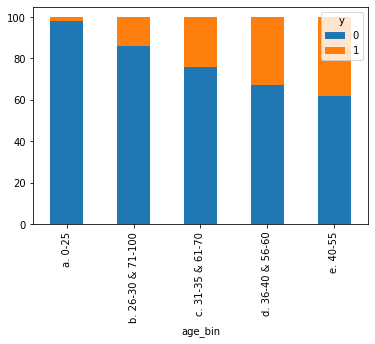

In [0]:
pd.crosstab(cs.age_bin, cs.y).apply(lambda x: 100*x/x.sum(), axis = 1).plot(kind = 'bar', stacked = True)

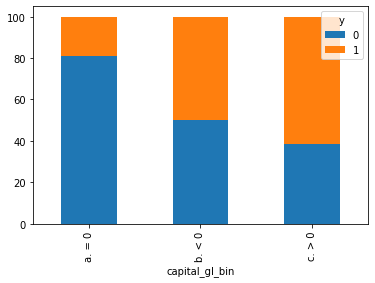

In [0]:
pd.crosstab(cs.capital_gl_bin, cs.y).apply(lambda x: 100*x/x.sum(), axis = 1).plot(kind = 'bar', stacked = True)

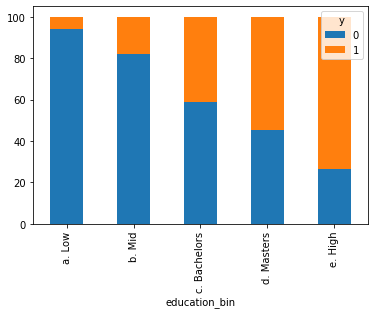

In [0]:
pd.crosstab(cs.education_bin, cs.y).apply(lambda x: 100*x/x.sum(), axis = 1).plot(kind = 'bar', stacked = True)

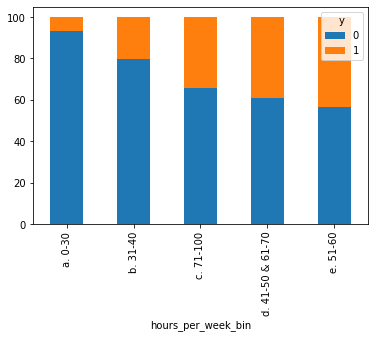

In [0]:
pd.crosstab(cs.hours_per_week_bin, cs.y).apply(lambda x: 100*x/x.sum(), axis = 1).plot(kind = 'bar', stacked = True)

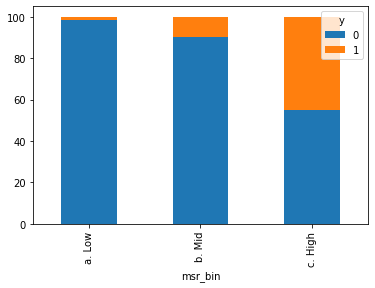

In [0]:
pd.crosstab(cs.msr_bin, cs.y).apply(lambda x: 100*x/x.sum(), axis = 1).plot(kind = 'bar', stacked = True)

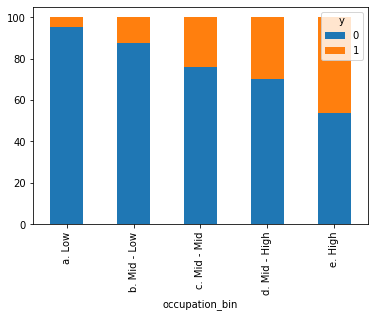

In [0]:
pd.crosstab(cs.occupation_bin, cs.y).apply(lambda x: 100*x/x.sum(), axis = 1).plot(kind = 'bar', stacked = True)

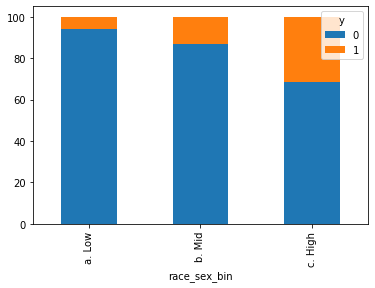

In [0]:
pd.crosstab(cs.race_sex_bin, cs.y).apply(lambda x: 100*x/x.sum(), axis = 1).plot(kind = 'bar', stacked = True)

**Build Descion Tree Classifier Models**



Definition: Given a data of attributes together with its classes, a decision tree produces a sequence of rules that can be used to classify the data.


Advantages: Simple to understand and visualize, requires little data preparation; numerical and categorical data


Disadvantages: Decision tree can create complex trees that do not generalize well, unstable becuase small variation in that data results in completely different structures.

**Split Data and Create Decision Tree**

In [0]:
#CREATE DUMMY VARIABLES FOR COLUMNS WITH PD_GETDUMMIES
#SPLIT DATA USING FLAG COLUMN

In [0]:
#split training and testing data
x_train = pd.get_dummies(cs[cs['flag']=='train'][['occupation_bin','msr_bin','capital_gl_bin','race_sex_bin','education_bin','age_bin','hours_per_week_bin']])
y_train = cs[cs['flag']=='train']['y']
x_test = pd.get_dummies(cs[cs['flag']=='test'][['occupation_bin','msr_bin','capital_gl_bin','race_sex_bin','education_bin','age_bin','hours_per_week_bin']])
y_test = cs[cs['flag']=='test']['y']

In [0]:
from sklearn.tree import DecisionTreeClassifier

In [0]:
dtree = DecisionTreeClassifier(max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(x_train, y_train)
y_pred = dtree.predict(x_test)

**Visualize Decision Tree**

In [0]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.957064 to fit



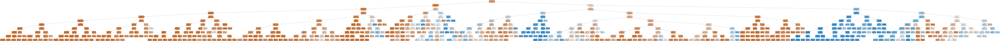

In [0]:
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

**Calculate Confusion Matrix, Accuracy, Precision, Recall, F1 Score, AUC Value, ROC Curve.**

In [0]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [0]:
confusion_matrix(y_test, y_pred)

array([[11538,   897],
       [ 1656,  2190]])

In [0]:
accuracy_score(y_test, y_pred)

0.8431914501566243

In [0]:
precision_score(y_test, y_pred)

0.7094266277939747

In [0]:
recall_score(y_test, y_pred)

0.5694227769110765

In [0]:
f1_score(y_test, y_pred)

0.6317611423626136

In [0]:
roc_auc_score(y_test, y_pred)

0.748643837188952

In [0]:
#get probabilities for roc curve
from sklearn import metrics
y_probs = dtree.predict_proba(x_test)
y_preds = y_probs[:,1]

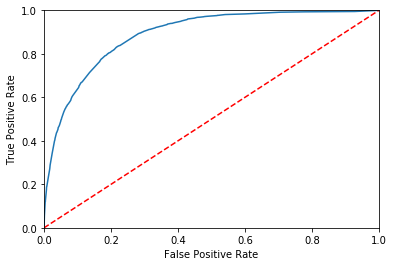

In [0]:
fpr, tpr, threshold = roc_curve(y_test, y_preds)


plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

**Tune Decision Tree Performance**

Vary Four hyperparameters manually, and train/score model for each set of hyperparameters. 

In [0]:
dtree2 = DecisionTreeClassifier(max_depth = 10, random_state = 101, max_features = None, min_samples_split = 15, min_samples_leaf = 30)

dtree2.fit(x_train, y_train)
y_pred2 = dtree2.predict(x_test)

In [0]:
print(accuracy_score(y_test, y_pred2))
print(precision_score(y_test, y_pred2))
recall_score(y_test, y_pred2)

0.843928505620048
0.7117818889970788


0.5702028081123245

In [0]:
f1_score(y_test, y_pred2)

0.6331745344304894

**Conclusion**


**Total Runtime to Train:** 5 seconds

**Best Tree:** The best tree has characteristics: split criteria = gini, minimum sample split = 15, minimum sample leaf = 30, and maximum depth = 10. The reason that this tree is classified as the best tree is because it scored highest in terms of accuracy, precision, recall and the F1 score. Accuracy refers to the overall ability of the model to make the correct prediction. Precision refers to the ability of the model to correctly identify negative predictions and recall refers to the ability of the model to predict positive outcomes. The F1 score is the harmonic mean, or balance, of recall and precision measures. The chosen tree maximizes all four values, and is the most accurate model for predictions.  


**Graph Best Tree**

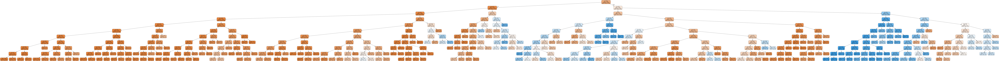

In [0]:
dot_data = StringIO()
export_graphviz(dtree2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph2 = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph2.create_png())

**Automation of Performance Tuning**

In [0]:

#read hyperparameter vs model performance table into dataframe

tuning = pd.read_csv('tuning_ca03.csv')

In [0]:
# USE FOR LOOP with i = (0-7) specify row and column/features

In [9]:
tuning.head(8)

,Criterion,Min Sample Split,Min Sample Leaf,Max Depth,Accuracy,Recall,Precision,F1 Score
0,entropy,15,15,10,NaN,NaN,NaN,NaN
1,entropy,15,15,18,NaN,NaN,NaN,NaN
2,entropy,15,30,10,NaN,NaN,NaN,NaN
3,entropy,10,15,10,NaN,NaN,NaN,NaN
4,gini,15,15,10,NaN,NaN,NaN,NaN
5,gini,15,15,18,NaN,NaN,NaN,NaN
6,gini,15,30,10,NaN,NaN,NaN,NaN
7,gini,10,15,10,NaN,NaN,NaN,NaN


In [0]:
for i in tuning.index:
  dtree3 = DecisionTreeClassifier(criterion = tuning.loc[i,'Criterion'],  
                                  min_samples_split = tuning.loc[i,'Min Sample Split'], 
                                  min_samples_leaf = tuning.loc[i, 'Min Sample Leaf'], 
                                  max_depth = tuning.loc[i,'Max Depth'], 
                                  random_state = 101, max_features = None)

  dtree3.fit(x_train, y_train)
  y_pred3 = dtree3.predict(x_test)

  tuning.loc[i,'Accuracy'] = accuracy_score(y_test, y_pred3)
  tuning.loc[i, 'Recall'] = recall_score(y_test, y_pred3)
  tuning.loc[i, 'Precision'] = precision_score(y_test, y_pred3)
  tuning.loc[i, 'F1 Score'] = f1_score(y_test, y_pred3)


In [12]:
tuning.head(8)

,Criterion,Min Sample Split,Min Sample Leaf,Max Depth,Accuracy,Recall,Precision,F1 Score
0,entropy,15,15,10,0.843806,0.570203,0.711320,0.632992
1,entropy,15,15,18,0.842270,0.563443,0.709097,0.627934
2,entropy,15,30,10,0.843437,0.568383,0.710894,0.631701
3,entropy,10,15,10,0.843806,0.570203,0.711320,0.632992
4,gini,15,15,10,0.843191,0.569423,0.709427,0.631761
5,gini,15,15,18,0.841902,0.560322,0.709348,0.626089
6,gini,15,30,10,0.843929,0.570203,0.711782,0.633175
7,gini,10,15,10,0.843191,0.569423,0.709427,0.631761


**Prediction using Trained Model**

In [0]:
#check how to code new individual data
x_train.head()

In [0]:
#code individual as 0, 1 to represent same as df
 x_prediction = {1:[0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0]}
 x_predict = pd.DataFrame.from_dict(x_prediction, orient ='index')

In [0]:
#use best tree to predict
predict_y = dtree2.predict(x_predict)
print(predict_y)


[1]


The prediction for the new individual is 1, meaning the income is predicted to be greater than 50,000 dollars. The accuracy score for the "Best" tree model was .8439 meaning that the probability that the prediction for the new individual is accurate is 84%. 